<h1><center>Evolución del Cuerpo de Agua de Aculeo </center></h1>
<h2><center>Autores: Diego Larraguibel</center></h2>

### Imports, reads and inits

In [1]:
from pathlib import Path
import os
import subprocess

from PIL import Image as PilImage, ImageDraw, ImageFont
from IPython.display import Image as IPyImage
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import ee
import geemap
from datetime import datetime

/Users/diegolarraguibel/Desktop/Proyectos/Debiased/.venv/lib/python3.12/site-packages/geemap/conversion.py:23: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


In [2]:
notebook_dir = Path().resolve().parent
data_dir = notebook_dir / "data"

In [3]:
# ee.Authenticate()
ee.Initialize()

In [4]:
bbox_coords = [
    [-70.947, -33.8665],  # Southwest corner (lower-left)
    [-70.947, -33.823],   # Northwest corner (upper-left)
    [-70.883, -33.823],   # Northeast corner (upper-right)
    [-70.883, -33.8665]   # Southeast corner (lower-right)
]

aoi = ee.Geometry.Polygon(bbox_coords)

### First Visualization of the Data

In [5]:
Map = geemap.Map(center=[-33.839, -70.9195], zoom=10)

# Add the AOI as a layer on the map. You can customize the color and opacity.
Map.addLayer(aoi, {'color': 'red'}, 'AOI')

# Display the map.
Map

Map(center=[-33.839, -70.9195], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchD…

### Extracting and Filtering Collection

In [6]:
def maskClouds_L7(image):
    """Masks clouds for Landsat 7 and filters images with <10% cloud cover."""
    qa = image.select("QA_PIXEL")  # Quality band
    cloud_mask = qa.bitwiseAnd(1 << 3).neq(0)  # Detect cloud pixels

    cloud_percentage = cloud_mask.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=aoi,
        scale=30,
        maxPixels=1e6
    ).get("QA_PIXEL")

    # Default to 100% clouds if cloud_percentage is missing
    cloud_percentage = ee.Algorithms.If(cloud_percentage, cloud_percentage, 100)

    # Return only valid images, avoiding empty images
    return image.set("CLOUDY_PERCENTAGE", cloud_percentage).clip(aoi)

def maskClouds_L89(image):
    """Masks clouds for Landsat 8 & 9 using the CLOUD_COVER property."""
    cloud_percentage = ee.Number(image.get("CLOUD_COVER"))

    # Return only valid images, avoiding empty images
    return image.set("CLOUDY_PERCENTAGE", cloud_percentage).clip(aoi)


In [7]:
# Landsat 7 filtering
landsat7 = (
    ee.ImageCollection("LANDSAT/LE07/C02/T1_TOA")
    .filterBounds(aoi)
    .filterDate('2008-01-01', '2021-12-31')
    .map(maskClouds_L7)
    .filter(ee.Filter.lt("CLOUDY_PERCENTAGE", 5))  # Keep only images with <5% clouds
    .filter(ee.Filter.notNull(["CLOUDY_PERCENTAGE"]))  # Remove None values
)

# Landsat 8 filtering
landsat8 = (
    ee.ImageCollection("LANDSAT/LC08/C02/T1_TOA")
    .filterBounds(aoi)
    .filterDate('2013-01-01', '2025-05-01')
    .map(maskClouds_L89)
    .filter(ee.Filter.lt("CLOUDY_PERCENTAGE", 5))
    .filter(ee.Filter.notNull(["CLOUDY_PERCENTAGE"]))
)

# Landsat 9 filtering
landsat9 = (
    ee.ImageCollection("LANDSAT/LC09/C02/T1_TOA")
    .filterBounds(aoi)
    .filterDate('2021-01-01', '2025-05-01')
    .map(maskClouds_L89)
    .filter(ee.Filter.lt("CLOUDY_PERCENTAGE", 5))
    .filter(ee.Filter.notNull(["CLOUDY_PERCENTAGE"]))
)

# Merge all collections
combined_collection = landsat7.merge(landsat8).merge(landsat9)

# Check final number of images
print("Final number of images:", combined_collection.size().getInfo())

Final number of images: 529


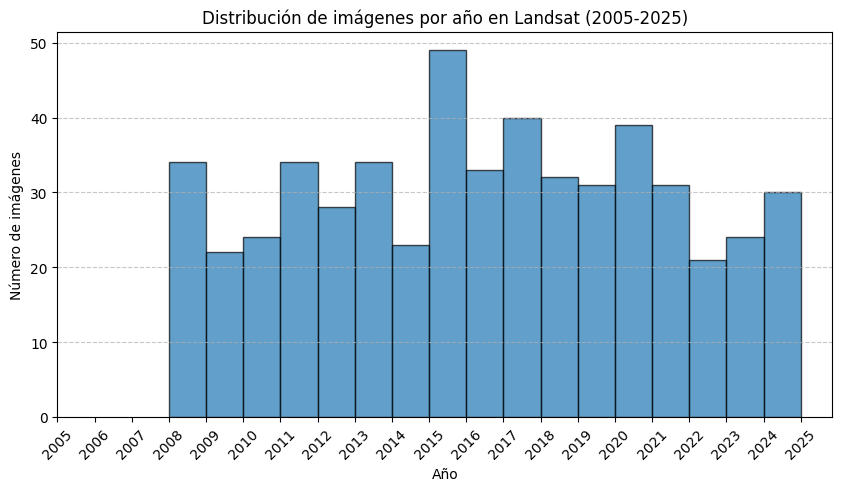

In [8]:
image_dates = combined_collection.aggregate_array("system:time_start").getInfo()

years = [pd.to_datetime(date, unit='ms').year for date in image_dates]

plt.figure(figsize=(10, 5))
plt.hist(years, bins=range(2008, 2026), edgecolor='black', alpha=0.7)
plt.xlabel("Año")
plt.ylabel("Número de imágenes")
plt.title("Distribución de imágenes por año en Landsat (2005-2025)")
plt.xticks(range(2005, 2026), rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [9]:
years = ee.List.sequence(2005, 2026)

# Function to filter images from September & October and pick the best one
def make_best_image_func(start_month, end_month, cloud_threshold):
    def best_image_per_year(year):
        year = ee.Number(year)

        # Definir fechas usando los parámetros
        start_date = ee.Date.fromYMD(year, start_month, 1)
        end_date = ee.Date.fromYMD(year, end_month, 30)

        # Filtrar colección
        filtered = (
            combined_collection
            .filterDate(start_date, end_date)
            .filter(ee.Filter.lt("CLOUDY_PERCENTAGE", cloud_threshold))
            .filter(ee.Filter.notNull(["CLOUDY_PERCENTAGE"]))
            .sort("CLOUDY_PERCENTAGE")
        )

        best_image = filtered.first()

        # Retornar imagen con el año seteado, si existe
        return ee.Algorithms.If(
            best_image,
            ee.Image(best_image).set("year", year),
            None
        )
    
    return best_image_per_year


# Apply the function to each year
best_images_late_func = make_best_image_func(9, 12, 5)  # Sept a Dic, nubes < 5%
best_images_mid_func = make_best_image_func(4, 8, 5)  # Abr a Agosto, nubes < 5%
best_images_early_func = make_best_image_func(1, 3, 5)  # Enero a Marzo, nubes < 5%

best_images_late = ee.ImageCollection(years.map(best_images_late_func)).filter(ee.Filter.notNull(["year"]))
best_images_early = ee.ImageCollection(years.map(best_images_early_func)).filter(ee.Filter.notNull(["year"]))
best_images_mid = ee.ImageCollection(years.map(best_images_mid_func)).filter(ee.Filter.notNull(["year"]))

best_images = best_images_early.merge(best_images_late).merge(best_images_mid).sort("system:time_start")

# Print the final number of selected images
print("Total selected images:", best_images.size().getInfo())


Total selected images: 53


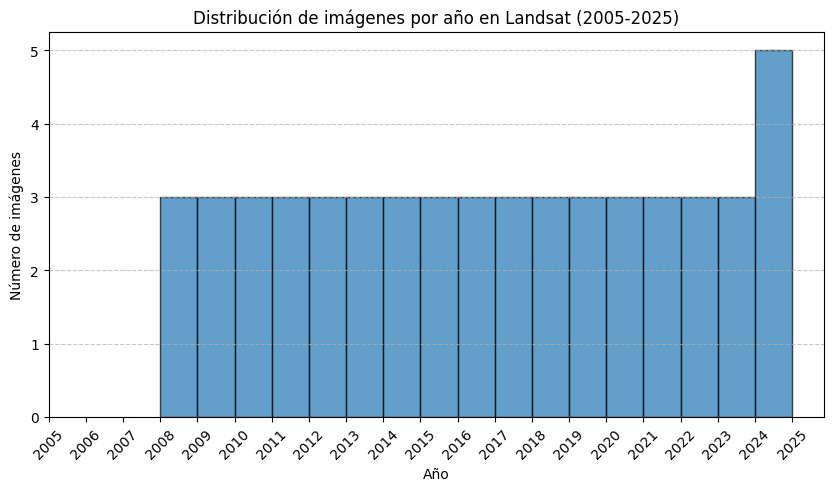

In [10]:
image_dates = best_images.aggregate_array("system:time_start").getInfo()

years = [pd.to_datetime(date, unit='ms').year for date in image_dates]

plt.figure(figsize=(10, 5))
plt.hist(years, bins=range(2008, 2026), edgecolor='black', alpha=0.7)
plt.xlabel("Año")
plt.ylabel("Número de imágenes")
plt.title("Distribución de imágenes por año en Landsat (2005-2025)")
plt.xticks(range(2005, 2026), rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

### Constructing NDWI

In [11]:
# Listar bandas de Landsat 7
landsat7_bands = ee.ImageCollection("LANDSAT/LE07/C02/T1_TOA").first().bandNames().getInfo()
print("Landsat 7 Bands:", landsat7_bands)

# Listar bandas de Landsat 8
landsat8_bands = ee.ImageCollection("LANDSAT/LC08/C02/T1_TOA").first().bandNames().getInfo()
print("Landsat 8 Bands:", landsat8_bands)

# Listar bandas de Landsat 9
landsat9_bands = ee.ImageCollection("LANDSAT/LC09/C02/T1_TOA").first().bandNames().getInfo()
print("Landsat 9 Bands:", landsat9_bands)


Landsat 7 Bands: ['B1', 'B2', 'B3', 'B4', 'B5', 'B6_VCID_1', 'B6_VCID_2', 'B7', 'B8', 'QA_PIXEL', 'QA_RADSAT', 'SAA', 'SZA', 'VAA', 'VZA']
Landsat 8 Bands: ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'QA_PIXEL', 'QA_RADSAT', 'SAA', 'SZA', 'VAA', 'VZA']
Landsat 9 Bands: ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'QA_PIXEL', 'QA_RADSAT', 'SAA', 'SZA', 'VAA', 'VZA']


In [12]:
ndwi_vis = {
    "min": -0.5,  # More contrast for dry land
    "max": 0.8,   # Highlights water areas better
    "palette": [
        "#d73027",  # Dry land (Red)
        "#fdae61",  # Less moist soil (Orange)
        "#ffffbf",  # Transition (Yellow/White)
        "#abd9e9",  # Wet areas (Cyan)
        "#4575b4"   # Deep water (Dark Blue)
    ]
}

In [13]:
def compute_ndwi(image):
    """Calcula el NDWI para una imagen Landsat y la visualiza."""
    # Identificar si la imagen es de Landsat 7, 8 o 9
    sensor = ee.String(image.get("SPACECRAFT_ID"))

    # Seleccionar las bandas correctas según el satélite
    ndwi = ee.Algorithms.If(
        sensor.equals("LANDSAT_7"),
        image.normalizedDifference(["B2", "B4"]).rename("NDWI"),  # Landsat 7
        image.normalizedDifference(["B3", "B5"]).rename("NDWI")   # Landsat 8 & 9
    )

    ndwi = ee.Image(ndwi).resample("bilinear").reproject(crs="EPSG:4326", scale=15)

    # Obtener fecha
    date = ee.Date(image.get("system:time_start")).format("YYYY-MM-dd")

    # Convertir NDWI a imagen visualizable con la paleta
    ndwi_viz = ndwi.visualize(**ndwi_vis)

    return ndwi_viz.set("date", date)

### Generating Images for GIF

In [15]:
data_dir

PosixPath('/Users/diegolarraguibel/Desktop/Proyectos/Debiased/projects/data')

In [14]:
# Apply the function to each image in the collection
ndwi_collection = best_images.map(compute_ndwi)

# Export NDVI Collection as a GIF
out_dir = os.path.join(data_dir, "results", "GIFS", "ndwi_results_aculeo")
os.makedirs(out_dir, exist_ok=True)

geemap.download_ee_image_collection(
    collection=ndwi_collection,
    out_dir=out_dir,
    region=aoi,  # Ensure the region is correctly defined
    scale=10,  # Reduce scale to get a higher-resolution image
    crs="EPSG:4326",
    dtype="uint8"
)

Total number of images: 53



Exception: Error downloading image collection: Please install geedim using `pip install geedim` or `conda install -c conda-forge geedim`

Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 714, 486
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 71

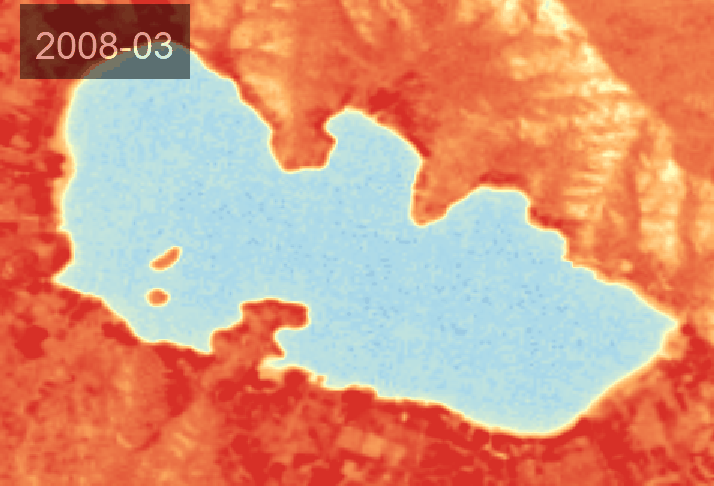

In [23]:
# Get the list of exported TIFF files
out_dir = os.path.join(data_dir, "results", "ndwi_results_aculeo")
frames_with_dates = []

# Get the list of exported TIFF files
tif_files = sorted([os.path.join(out_dir, f) for f in os.listdir(out_dir) if f.endswith(".tif")])
if not tif_files:
    raise FileNotFoundError(f"No TIF files found in {out_dir}. Check your NDWI export.")

# Convert each TIFF to PNG using gdal_translate
png_files = []
for tif in tif_files:
    png_file = tif.replace(".tif", ".png")
    subprocess.run(["gdal_translate", "-of", "PNG", tif, png_file], check=True)
    png_files.append(png_file)

print(sorted([name.split("_")[-1] for name in png_files]))
# Create a list to hold the annotated frames
frames = []
for png in png_files:
    image = PilImage.open(png).convert("RGB")
    
    # Extraer la fecha desde el nombre del archivo
    name = os.path.splitext(os.path.basename(png))[0]
    parts = name.split("_")
    if parts:
        date_part = parts[-1]
        try:
            dt = datetime.strptime(date_part[:8], "%Y%m%d")  # e.g., 20231002
            formatted_date = dt.strftime("%Y-%m")
        except:
            dt = None
            formatted_date = "Unknown Date"
    else:
        dt = None
        formatted_date = "Unknown Date"
    
    # Try to load a larger TrueType font
    possible_fonts = [
        "DejaVuSans-Bold.ttf",
        "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf",  # Common on Linux
        "/Library/Fonts/Arial.ttf",                               # Common on macOS
        "arial.ttf"                                               # Windows
    ]

    font_size = int(image.size[1] * 0.08)  # Usa un valor más bajo si quieres texto más pequeño
    font = None
    for font_path in possible_fonts:
        try:
            font = ImageFont.truetype(font_path, font_size)
            break
        except IOError:
            continue
    if font is None:
        print("No TTF font found, using default.")
        font = ImageFont.load_default()
    
    # Create a copy of the image to apply the overlay
    overlay = image.copy()
    overlay_draw = ImageDraw.Draw(overlay)

    # Define text position and calculate text size
    text_position = (int(image.width * 0.05), int(image.height * 0.05))  # Increased Y to move text up a bit
    bbox = overlay_draw.textbbox(text_position, formatted_date, font=font)
    text_width, text_height = bbox[2] - bbox[0], bbox[3] - bbox[1] + 20

    # Adjust text box height to be slightly larger than the text
    bg_margin = 15  # Extra padding for readability
    rectangle_position = [
        text_position[0] - bg_margin,
        text_position[1] - bg_margin - 5,  # Moves the box up a little
        text_position[0] + text_width + bg_margin,
        text_position[1] + text_height + int(bg_margin * 0.5)  # Adjust to keep centered
    ]
    
    # Draw the black background
    overlay_draw.rectangle(rectangle_position, fill=(0, 0, 0, 180)) 

    # Add text with a black outline for contrast
    outline_color = (0, 0, 0)       # Black outline
    text_color = (255, 255, 255)    # Fully opaque white text
    shadow_offset = 3

    for dx, dy in [(-shadow_offset, -shadow_offset), (shadow_offset, shadow_offset)]:
        overlay_draw.text((text_position[0] + dx, text_position[1] + dy), formatted_date, font=font, fill=outline_color)

    overlay_draw.text(text_position, formatted_date, font=font, fill=text_color)  # Fully opaque

    # Blend the overlay with the original image (keeps text and background visible)
    image = PilImage.blend(image, overlay, alpha=0.5)

    # Append the annotated image to the frames list
    frames.append(image)

    if dt:  # Solo incluir si tiene fecha válida
        frames_with_dates.append((dt, image))

# Ordenar cronológicamente por fecha real
frames_with_dates.sort(key=lambda x: x[0])

# Extraer solo las imágenes en orden correcto
frames = [img for (_, img) in frames_with_dates]

# Save the frames as an animated GIF
output_gif = os.path.join(data_dir, "results", "GIFS", "ndwi_aculeo.gif")
if frames:
    frames[0].save(output_gif, save_all=True, append_images=frames[1:], duration=550, loop=0)
    print(f"GIF saved as {output_gif}")
else:
    print("No frames were generated. Check your NDWI images.")

# Display the GIF in the notebook
IPyImage(filename=output_gif)